# Natural Language Processing


## Defining Natural Language Processing

As we continue further into our content this semester, you have probably noticed that each tool takes us to a new level of being able to conduct analysis with less code. As we progress, we move toward what are called "higher level" programming tools. Python itself is a high-level programming language, meaning that it is written in a way that is easier for humans to read than computers, with lots of translation happening behind the scenes.

Tools like `pandas` remove a lot of the manual work from data processing. `numpy` and `scipy` handle much of the mathematical and statistical work that we want to do with our data. Natural Language Processing (NLP) is a tool similar to regex, but allowing us to take our text analytics to entirely new levels.

Where regex allows us to look for text-based patterns in our words or string content, we want to go further. We want to look for **meaning**-based content. How do I find content that reflects anger? What words are most common in those contexts? What about when the content reflects joy? Sadness? Regex is not enough in these cases, and so we build to an even more powerful tool.

NLP is a broad set of tools designed in order to enable users to work with text in ways that a human might work with text. When we work with text, we look for structures like sentences, and within those sentences we look for nouns to tell us who or what is the focus of the content. We look for verbs to understand what is happening. Adjectives and other descriptors help us to better understand the nuances of context. NLP models are trained to recognize these elements in text, and to be able to leverage that content to break text down and provide human users valuable information at a larger scale than would be possible if the document were simply read (slowly) by a human.

| Regex | NLP |
| --- | --- |
| Create patterns to match in text | Identify the structure of text and use that to refine information|
| Used to verify or find data | Used to analyze data |
| Applies user-defined rules | Relies heavily on ML-based (or other) models |


## What NLP can do

So what can NLP do for us?

### Identify parts of speech

When we pass a document (really a string, but typically we provide a fairly large string to an NLP algorithm) to an NLP model, it is able to identify parts of speech (nouns, verbs, etc.). This enables us to quickly break down our text to find various kinds of keywords, and is the first step in many more complex pipelines.

### Iterate over sentences

NLP can identify sentences within a document. This makes for a powerful iterative tool, as we will be able to define a processing pipeline for each sentence, and then apply that pipeline to as many sentences as exist within our document, without having to write complex code to try and recognize where each sentence starts and ends (this is MUCH harder than it sounds).

### Find words used to describe various nouns (or anything else!)

Beyond simply identifying parts of speech, NLP models can be used to build a structural dependency tree of each sentence. This structure allows us to associate adjectives with their respective nouns, or adverbs to the verb that they modify. We can explore how various entities are described in our document based on word associations. We can even visualize the structure of the sentence using simple mapping functions.

### Filter text for analysis

We can use NLP to filter our text. We can look for sentences about a specific entity, or explore other ways of filtering our text in order to create a better understanding of overall patterns in the document.

### Conduct sentiment analysis

One of the most powerful capabilities resulting from NLP models is the ability to analyze sentiment within the text. Words have the ability to convey literal meanings, as well as the more subtle capacity to convey emotion. By looking for word combinations in our text, NLP models can provide sentiment measurements at the word, sentence, or document level. This provides the ability to sort through texts for specific sentiments to learn about the way in which emotion affects the outcomes we are examining in text. One example might be looking through descriptions for negative emotions, and being able to respond to unhappy customers by flagging negative descriptions.


## Implementing NLP models

To get started with NLP models, we need to install the right libraries (and a corpus!). The library that we will use is `spacy`, although there are multiple other options available to us. One other common NLP library is `nltk`, the Natural Language Toolkit (NLTK). In my experience NLTK is more commonly employed when someone wants to create their own model from scratch, rather than implement pre-built and optimized NLP models.

In addition to a library to conduct NLP, we also rely on a **corpus**. A corpus is essentially a model of a specific language that is built to enable the actual analysis. `spacy` as a library is a general structure that can be implemented on ANY language. The corpus allows us to select a specific language, and a model of that language built on a specific set of information.

When we install `spacy`, we will also download the `en_core_web_sm` corpus. This corpus is a small-sized model of the english language, and was trained on web-based data. That means that it will perform best on data drawn from websites, and is not as strong a model for other contexts (like analyzing Pride and Prejudice). That doesn't mean that we can't use in other contexts, but it does suggest that results will not be as refined or accurate.

We need to get ourselves some text to analyze before we jump into the NLP world. In true form, here is another favorite old book. We will take a look at the first three chapters of Jane Eyre from [Project Gutenberg](https://www.gutenberg.org/browse/scores/top).

In [ ]:
import requests

jane = requests.get(
"https://github.com/dustywhite7/Econ8320/raw/master/AssignmentData/janeEyreCh1to3.txt"
).text

You can take a look at the text to get an idea of what we will be working with. Once you're ready, we will go ahead and import the `spacy` library. The very first thing we do once we import `spacy` is to load the coprus, so that we are able to use its language models to parse our document. Let's run the code, and then discuss what is happening.

In [ ]:
import spacy

nlp = spacy.load("en_core_web_sm")
doc = nlp(jane)

### The structure of a parsed document

When we create an `nlp` object based on our corpus, we are creating our pipeline for working with text. Our corpus contains all of the information necessary to prepare our data for analysis. When we create our `doc` object, we are passing our document through the processing pipeline. Our new parsed document (`doc` in this case), has some important **attributes**:

- `sents` - a generator function to iterate over each sentence in the document
- `token` - each individual element of the document
    - Elements exist at the word/punctuation level

After being processed, our document has been broken down into tokens, and then (to some extent) reconstructed into sentences. Additionally, each token is mapped out in relation to the other tokens within a sentence, and is described using various attributes to inform how that token relates to the text around it.

In [ ]:
test = [i.text.replace('\n', ' ') for i in doc.sents][:10]
# print first 10 sentences, replacing newlines with spaces

test


['CHAPTER I   There was no possibility of taking a walk that day.',
 'We had been wandering, indeed, in the leafless shrubbery an hour in the morning; but since dinner (Mrs. Reed, when there was no company, dined early) the cold winter wind had brought with it clouds so sombre, and a rain so penetrating, that further outdoor exercise was now out of the question.  ',
 'I was glad of it: I never liked long walks, especially on chilly afternoons: dreadful to me was the coming home in the raw twilight, with nipped fingers and toes, and a heart saddened by the chidings of Bessie, the nurse, and humbled by the consciousness of my physical inferiority to Eliza, John, and Georgiana Reed.  ',
 'The said Eliza, John, and Georgiana were now clustered round their mama in the drawing-room: she lay reclined on a sofa by the fireside, and with her darlings about her (for the time neither quarrelling nor crying) looked perfectly happy.',
 'Me, she had dispensed from joining the group; saying, “She reg

### Understanding tokens

Recall that each word is represented as a token in the processed document. These tokens are immensely powerful. They are the word, but also more than that. Words in the English language are often modified based on context. Verbs are conjugated, nouns may be plural, among many possibilities. Each word is **tokenized** through our corpus in order to identify the underlying word.

This is important, because we might want to look for each instance of a single word in our corpus. Let's say that we want to find every instance of "eat". If we look for "eat", we want to make sure that "eats" and "ate", as well as "eating" and other forms are all considered. This is where tokenization becomes critical. Each token contains the text value from the original document, but also the **lemmatized** word. The lemma is the base form of the word, allowing us to search for lemmas rather than the text word. This streamlines our ability to analyze text by focusing on lemmas rather than unprocessed text.

Other valuable attributes are also associated with our tokens:
- `lemma_` - the "root word" from which a token/word is derived
- `pos_` - the part of speech of a token/word
- `dep_` - the relationship of dependent tokens to the parent token (adjectives to nouns, etc.)
- `like_email`/`like_num`/`like_url` - check if a token is like an email, number, or url (unlikely in Jane Eyre)

Let's look at the first 100 non-space, non-punctuation lemmas in Jane Eyre:

In [ ]:
lemmas100 = [(i.lemma_, i.text) for i in doc if (not i.is_punct) and (not i.is_space)][:100]

print(lemmas100) # The lemma comes first, followed by the actual word in the text.

[('chapter', 'CHAPTER'), ('I', 'I'), ('there', 'There'), ('be', 'was'), ('no', 'no'), ('possibility', 'possibility'), ('of', 'of'), ('take', 'taking'), ('a', 'a'), ('walk', 'walk'), ('that', 'that'), ('day', 'day'), ('we', 'We'), ('have', 'had'), ('be', 'been'), ('wandering', 'wandering'), ('indeed', 'indeed'), ('in', 'in'), ('the', 'the'), ('leafless', 'leafless'), ('shrubbery', 'shrubbery'), ('an', 'an'), ('hour', 'hour'), ('in', 'in'), ('the', 'the'), ('morning', 'morning'), ('but', 'but'), ('since', 'since'), ('dinner', 'dinner'), ('Mrs.', 'Mrs.'), ('Reed', 'Reed'), ('when', 'when'), ('there', 'there'), ('be', 'was'), ('no', 'no'), ('company', 'company'), ('dine', 'dined'), ('early', 'early'), ('the', 'the'), ('cold', 'cold'), ('winter', 'winter'), ('wind', 'wind'), ('have', 'had'), ('bring', 'brought'), ('with', 'with'), ('it', 'it'), ('cloud', 'clouds'), ('so', 'so'), ('sombre', 'sombre'), ('and', 'and'), ('a', 'a'), ('rain', 'rain'), ('so', 'so'), ('penetrate', 'penetrating'), (

We can also filter words by part of speech using the `pos_` attribute of our tokens. Let's look for the first 100 nouns in the text.

In [ ]:
nouns = [i.text for i in doc if i.pos_=='NOUN'][:100]

print(nouns) # The lemma comes first, followed by the actual word in the text.

['CHAPTER', 'possibility', 'walk', 'day', 'leafless', 'shrubbery', 'hour', 'morning', 'dinner', 'company', 'winter', 'wind', 'clouds', 'rain', 'exercise', 'question', 'walks', 'afternoons', 'home', 'twilight', 'fingers', 'toes', 'heart', 'chidings', 'nurse', 'consciousness', 'inferiority', 'mama', 'drawing', 'room', 'sofa', 'fireside', 'darlings', 'time', 'crying', 'group', 'necessity', 'distance', 'observation', 'earnest', 'disposition', 'manner', 'franker', 'privileges', 'children', 'cavillers', 'questioners', 'child', 'elders', 'manner', 'breakfast', 'room', 'drawing', 'room', 'bookcase', 'volume', 'care', 'pictures', 'window', 'seat', 'feet', 'moreen', 'curtain', 'retirement', 'Folds', 'drapery', 'view', 'hand', 'left', 'panes', 'glass', 'day', 'intervals', 'leaves', 'book', 'aspect', 'winter', 'afternoon', 'blank', 'mist', 'cloud', 'scene', 'lawn', 'storm', 'shrub', 'rain', 'blast', 'book', 'History', 'letterpress', 'pages', 'child', 'blank', 'haunts', 'sea', 'fowl', 'rocks', 'pro

Pretty cool! If you look through that list, you'll see that there are a lot of different kinds of nouns. Two that stood out to me are "drawing" and "room"... oh wait... that's ONE NOUN that is two words! And leads us right into **noun chunks**. ;)

Sometimes, you want to be able to see a "complete" noun, and noun chunks are the tool to use!

In [ ]:
nouns = [i.text.replace('\n', ' ') for i in doc.noun_chunks][:100] # getting rid of new lines in our noun chunks

print(nouns)

['I', 'no possibility', 'a walk', 'We', 'the leafless shrubbery', 'the morning', 'dinner', 'Mrs. Reed', 'no company', 'the cold winter wind', 'it', 'clouds', 'further outdoor exercise', 'the question', 'I', 'it', 'I', 'long walks', 'chilly afternoons', 'me', 'the coming home', 'the raw twilight', 'nipped fingers', 'toes', 'a heart', 'the chidings', 'Bessie', 'the nurse', 'the consciousness', 'my physical inferiority', 'Eliza', 'John', 'Georgiana Reed', 'The', 'Eliza', 'John', 'Georgiana', 'their mama', 'the drawing-room', 'she', 'a sofa', 'the fireside', 'her darlings', 'her', 'the time', 'crying', 'Me', 'she', 'the group', 'She', 'the necessity', 'me', 'a distance', 'she', 'Bessie', 'her own observation', 'I', 'good earnest', 'a more sociable and childlike disposition', 'something', 'franker', 'it', 'she', 'me', 'privileges', 'contented, happy, little children', 'Bessie', 'I', 'I', 'Jane', 'I', 'cavillers', 'questioners', 'something', 'a child', 'her elders', 'that manner', 'you', 'A 

That's better. Noun chunks include all of the modifiers for a given noun, and make it easier to build a more complete understanding of the references being made. Why do we care? Because "the red moreen curtain" is the object, and we want to be sure to understand the implication of the full object, rather than only the word within the noun chunk that is actually a noun.

If we want to understand more about the nature of the relationships between words within a sentence, we can plot a dependency tree.

**NOTE: When you run the following code, be sure to click the STOP button when you're done, or no other code will run! The renderer for the dependency tree will keep running until you terminate it!**

In [ ]:
from spacy import displacy

sent = [i for i in doc.sents][100]
displacy.serve(sent, style="dep")

/home/codio/miniconda3/lib/python3.9/site-packages/spacy/displacy/__init__.py:103: UserWarning: [W011] It looks like you're calling displacy.serve from within a Jupyter notebook or a similar environment. This likely means you're already running a local web server, so there's no need to make displaCy start another one. Instead, you should be able to replace displacy.serve with displacy.render to show the visualization.
  warnings.warn(Warnings.W011)



Using the 'dep' visualizer
Serving on http://0.0.0.0:5000 ...

Shutting down server on port 5000.


Using this mapping, we can see each of the clauses of the sentence, and how words within the sentence relate to one another. The mapping can help us to understand whether or not we have correctly identified parts of speech that are associated with the topics we are trying to uncover in our code.


## Sentiment Analysis

My personal favorite part of NLP, sentiment analysis is a very powerful instrument for understanding text and creating actionable items. Many firms use sentiment analysis in combination with their social media accounts to measure engagement and understand how successful marketing campaigns or other interactions are with target audiences.

In order to conduct sentiment analysis using spacy, we are going to use a library called `spacytextblob`. This library includes supplemental material that expands the english corpus' ability to process our data. When utilized, `spacytextblob` is going to add sentiment analysis models to the general pipeline created through `spacy`.

We can incorporate the `SpacyTextBlob` process into our pipeline like this:

In [ ]:
import spacy
from spacytextblob.spacytextblob import SpacyTextBlob
import requests

jane = requests.get(
"https://github.com/dustywhite7/Econ8320/raw/master/AssignmentData/janeEyreCh1to3.txt"
).text

nlp = spacy.load('en_core_web_sm')
nlp.add_pipe('spacytextblob')

blob = nlp(jane)

sents = [i for i in blob.sents]

for sentence in sents[:10]:
    print("Polarity: {0:3.2f}, Subjectivity: {1:3.2f}".format(sentence._.polarity, sentence._.subjectivity))

Polarity: 0.00, Subjectivity: 0.00
Polarity: -0.17, Subjectivity: 0.60
Polarity: -0.30, Subjectivity: 0.69
Polarity: 0.13, Subjectivity: 0.67
Polarity: 0.41, Subjectivity: 0.66
Polarity: 0.00, Subjectivity: 0.00
Polarity: 0.37, Subjectivity: 0.53
Polarity: 0.00, Subjectivity: 0.00
Polarity: 0.00, Subjectivity: 0.00
Polarity: 0.03, Subjectivity: 0.13


We can add code to our processing pipeline using the `nlp.add_pipe()` method on our `nlp` object. In this case, we are adding the sentiment analysis information created through `SpacyTextBlob`, but this can be literally anything. We can create any kind of function that we want to implement on our code, and can add that functionality to our pipeline in the same way. More examples are available in the `spacy` [documentation](https://spacy.io/usage/processing-pipelines#pipelines).

If you want to get more in-depth with NLP, I highly recommend that you explore the course material available through `spacy`'s own NLP curriculum (freely available!): https://course.spacy.io/en/

## Solve it!

In this project, you will use the text from [chapters 44 and 45](https://github.com/dustywhite7/Econ8320/raw/refs/heads/master/AssignmentData/prideAndPrejudiceChapters.txt) of *Pride and Prejudice*. Please find the following information:

- The number of sentences (store as `int` in a variable named `sentences`)
- A list of all proper nouns used across the two chapters (stored as strings in the `names` variable)
- A DataFrame containing a count of the top 20 adjectives used in the text (stored in the `adjectives` variable)
    - Be sure to make all words lower case ONLY!
- A bar chart of the top 20 adjectives used in the text stored in a variable called `fig`


Place all of your code in the cell below, labeled `#si-exercise`.

125
<class 'int'>
[('own', 7), ('much', 7), ('more', 7), ('other', 6), ('such', 6), ('little', 6), ('very', 5), ('many', 5), ('anxious', 4), ('least', 4), ('good', 4), ('whole', 4), ('pleased', 4), ('last', 4), ('great', 4), ('new', 3), ('few', 3), ('lively', 3), ('evident', 3), ('eager', 3)]


<Axes: >

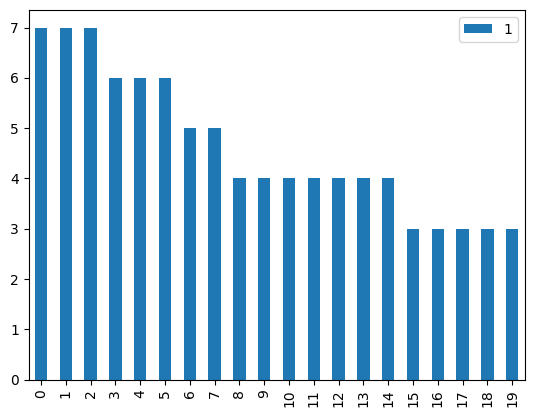

In [66]:
#si-exercise

#import requests
#import spacy
#import json

#jane_2 = requests.get("https://raw.githubusercontent.com/dustywhite7/Econ8320/refs/heads/master/AssignmentData/prideAndPrejudiceChapters.txt").text #chap 44 and 45 of jane erye


#nlp = spacy.load("en_core_web_sm") #our nlp object that will process our text,
#doc_2 = nlp(jane_2)

#sentence_list = [i for i in doc_2.sents] #give a list of all the sentences in jane erye

#sentences = len(sentence_list)

#print(sentences) #length came back as 125

#print(type(sentences)) #check to make sure its an integer, type came back as int so good to go

#si-exercise

import requests
import spacy
import json
import pandas as pd
from collections import Counter

jane_2 = requests.get("https://raw.githubusercontent.com/dustywhite7/Econ8320/refs/heads/master/AssignmentData/prideAndPrejudiceChapters.txt").text #chap 44 and 45 of jane erye


nlp = spacy.load("en_core_web_sm") #our nlp object that will process our text,
doc_2 = nlp(jane_2)

sentence_list = [i for i in doc_2.sents] #give a list of all the sentences in jane erye

sentences = len(sentence_list)

print(sentences) #length came back as 125

print(type(sentences)) #check to make sure its an integer, type came back as int so good to go

#part 2 (nouns)

names = set([i.text for i in doc_2.noun_chunks if i.root.pos_ == "PROPN" and ('_' not in i.text) and (i.text.istitle())]) #finds the propernoun used across two chapters and makes a lsit and make a list,
#how do i make sure each one is unique(no duplicates)

#print(names) #I think it worked, all are captialized proper nouns, and no underscores????



#part 3 (adjectives) A DataFrame containing a count of the top 20 adjectives used in the text (stored in the adjectives variable), Be sure to make all words lower case ONLY!

adjectives_list = [i.text.lower() for i in doc_2 if i.pos_=='ADJ'] #this creates the ist of all the lowercase adjectives

adjectives_count = Counter(adjectives_list) #this counts the number of occurences of each adjective on the list

adjectives_top = adjectives_count.most_common(20) #this give a list of the top 20 most common adjectives

print(adjectives_top)

adjectives = pd.DataFrame(adjectives_top) #create teh dataframe of the 20 most common adjectives

adjectives

#Part 4 A bar chart of the top 20 adjectives used in the text stored in a variable called fig

fig = adjectives.plot.bar()

fig


#print(sentence_list)
#sentence_list = f.read().split('\n')
#number of sentences

#sentence
#json.loads(sentence_list.text)

#try:
   # json.loads(sentence_list[0].text)  # Attempt to load sentence text as JSON
#except json.JSONDecodeError:
   # print("Sentence is not valid JSON. Text:", sentence_list[0].text) #this return that what im trying to process through JSON rn is not vailid.. duh, need to problem solve



#print(sentence_list)
#sentence_list = f.read().split('\n')
#number of sentences

#sentence
#json.loads(sentence_list.text)

#try:
   # json.loads(sentence_list[0].text)  # Attempt to load sentence text as JSON
#except json.JSONDecodeError:
   # print("Sentence is not valid JSON. Text:", sentence_list[0].text) #this return that what im trying to process through JSON rn is not vailid.. duh, need to problem solve


In [62]:
#testing solve it code

#test for sentences

typeint = isinstance(sentences, int)
lengthsent = -5<=(sentences-125)<=5
(typeint & lengthsent)

#Got true so i think this passed!



True

In [67]:
#testing
typelist = isinstance(names, list)
test = True
for i in names:
    if (str(i).lower()==i) | (len(str(i).split(" "))>2):
                test = False

print(test)

True


LECTURE VIDS WORK


In [30]:
#using SpaCy

import requests

jane = requests.get("https://github.com/dustywhite7/Econ8320/raw/master/AssignmentData/janeEyreCh1to3.txt").text #first 3 chapters of jane erye
print(jane)

import spacy
nlp = spacy.load("en_core_web_sm") #our nlp object that will process our text,
doc = nlp(jane)


CHAPTER I


There was no possibility of taking a walk that day. We had been
wandering, indeed, in the leafless shrubbery an hour in the morning;
but since dinner (Mrs. Reed, when there was no company, dined early)
the cold winter wind had brought with it clouds so sombre, and a rain
so penetrating, that further outdoor exercise was now out of the
question.

I was glad of it: I never liked long walks, especially on chilly
afternoons: dreadful to me was the coming home in the raw twilight,
with nipped fingers and toes, and a heart saddened by the chidings of
Bessie, the nurse, and humbled by the consciousness of my physical
inferiority to Eliza, John, and Georgiana Reed.

The said Eliza, John, and Georgiana were now clustered round their mama
in the drawing-room: she lay reclined on a sofa by the fireside, and
with her darlings about her (for the time neither quarrelling nor
crying) looked perfectly happy. Me, she had dispensed from joining the
group; saying, “She regretted to be under t

In [31]:
#make a list comprehension
sentences = [i for i in doc.sents] #give a list of all the sentences in jane erye

sentences[:5] #first 5 sentences

[token for token in sentences[1]] #looks for all of the tokens in sentence 2 of the book

[token.pos_ for token in sentences[1]] #looks for the token with part of speach (pos)

[token.dep_ for token in sentences[1]] #how the different words relate to the root of the sentences (dep is the relationship of dependent tokens to the parent token (adjectives to nouns, etc.))

[token for token in sentences[1] if token.dep_=="ROOT"] #finds the root in the sentence (I think its supposed to get 'wandering' as the root but for some reason i get 'been')

sentences[1]

We had been
wandering, indeed, in the leafless shrubbery an hour in the morning;
but since dinner (Mrs. Reed, when there was no company, dined early)
the cold winter wind had brought with it clouds so sombre, and a rain
so penetrating, that further outdoor exercise was now out of the
question.


In [32]:
#Lemma ( finds the root word from which a token/word is derived)
[token.lemma_ for token in sentences[1]]


['we',
 'have',
 'be',
 '\n',
 'wander',
 ',',
 'indeed',
 ',',
 'in',
 'the',
 'leafless',
 'shrubbery',
 'an',
 'hour',
 'in',
 'the',
 'morning',
 ';',
 '\n',
 'but',
 'since',
 'dinner',
 '(',
 'Mrs.',
 'Reed',
 ',',
 'when',
 'there',
 'be',
 'no',
 'company',
 ',',
 'dine',
 'early',
 ')',
 '\n',
 'the',
 'cold',
 'winter',
 'wind',
 'have',
 'bring',
 'with',
 'it',
 'cloud',
 'so',
 'sombre',
 ',',
 'and',
 'a',
 'rain',
 '\n',
 'so',
 'penetrate',
 ',',
 'that',
 'further',
 'outdoor',
 'exercise',
 'be',
 'now',
 'out',
 'of',
 'the',
 '\n',
 'question',
 '.',
 '\n\n']

In [33]:
#noun chucnks
sentences[1]
[i for i in sentences[1].noun_chunks]
[i.root for i in sentences[1].noun_chunks] #gets rid of the extra words (like the and a) and just isolates the nounds
[i.root for i in sentences[1].noun_chunks if i.root.pos_=="PROPN"] #shows only the root for propernounds specifically

[[i for i in sentences[j].noun_chunks if i.root.pos_== "PROPN"] for j in range(20)] #in the first 20 sentences find the propernoun and make a list

[[],
 [Mrs. Reed],
 [Bessie, Eliza, John, Georgiana Reed],
 [Eliza, John, Georgiana],
 [Bessie],
 [],
 [],
 [],
 [],
 [],
 [],
 [a Turk],
 [Folds],
 [],
 [cloud],
 [British Birds],
 [],
 [Norway,
  the Lindeness,
  Naze,
  the North Cape,
  the Northern Ocean,
  farthest Thule,
  the stormy Hebrides],
 [Lapland,
  Siberia,
  Spitzbergen,
  Nova Zembla,
  Iceland,
  Greenland,
  the Arctic Zone],
 []]

In [90]:
#Twitter and NLP

#using kaggle nltk twtitter sample dataset

#imported into colab and directed it from there (note that we wil have to redownload the file in colab everytime for this to work i think)
with open("/content/tweets.20150430-223406.json") as f:
  tweets = f.read().split('\n')[:-1] #this will read file into a string, then (\n) will split it as a new line (so every obejct is split by the new line character),the [:-1] is skipping the last thing because its emplty

#C:\Users\fyoun\OneDrive\Documents\(2) Data Analysis attempt 2\twitter_samples
#or can read it in directly from computer
#with open("/Users/fyoun/OneDrive/Documents/twitter_samples/tweets.20150430-223406.json") as f: #for some reason i cant get it to work when reading it directly from my computer so will jsut upload it into colab like i did above
  #tweets = f.read().splie('\n')[:-1] #this will read file into a string, then (\n) will split it as a new line (so every obejct is split by the new line character),the [:-1] is skipping the last thing because its emplty

import json
json.loads(tweets[0]) #make a clean dictionary of tweets


{'in_reply_to_status_id': None,
 'contributors': None,
 'filter_level': 'low',
 'coordinates': None,
 'id_str': '593891099434983425',
 'favorited': False,
 'created_at': 'Thu Apr 30 21:34:06 +0000 2015',
 'favorite_count': 0,
 'in_reply_to_status_id_str': None,
 'retweeted_status': {'in_reply_to_status_id': None,
  'contributors': None,
  'filter_level': 'low',
  'coordinates': None,
  'id_str': '593885295323521025',
  'favorited': False,
  'created_at': 'Thu Apr 30 21:11:02 +0000 2015',
  'favorite_count': 3,
  'in_reply_to_status_id_str': None,
  'in_reply_to_user_id': None,
  'in_reply_to_screen_name': None,
  'place': None,
  'id': 593885295323521025,
  'retweeted': False,
  'truncated': False,
  'text': 'Indirect cost of the UK being in the EU is estimated to be costing Britain £170 billion per year! #BetterOffOut #UKIP',
  'in_reply_to_user_id_str': None,
  'lang': 'en',
  'retweet_count': 11,
  'user': {'statuses_count': 4589,
   'id_str': '929903647',
   'followers_count': 2973

In [37]:
#process tweets
tweet_data = [json.loads(i) for i in tweets ] [:1000] #list of 1000 dictionaries in this tweet data




{'in_reply_to_status_id': None,
 'contributors': None,
 'filter_level': 'low',
 'coordinates': None,
 'id_str': '593891099434983425',
 'favorited': False,
 'created_at': 'Thu Apr 30 21:34:06 +0000 2015',
 'favorite_count': 0,
 'in_reply_to_status_id_str': None,
 'retweeted_status': {'in_reply_to_status_id': None,
  'contributors': None,
  'filter_level': 'low',
  'coordinates': None,
  'id_str': '593885295323521025',
  'favorited': False,
  'created_at': 'Thu Apr 30 21:11:02 +0000 2015',
  'favorite_count': 3,
  'in_reply_to_status_id_str': None,
  'in_reply_to_user_id': None,
  'in_reply_to_screen_name': None,
  'place': None,
  'id': 593885295323521025,
  'retweeted': False,
  'truncated': False,
  'text': 'Indirect cost of the UK being in the EU is estimated to be costing Britain £170 billion per year! #BetterOffOut #UKIP',
  'in_reply_to_user_id_str': None,
  'lang': 'en',
  'retweet_count': 11,
  'user': {'statuses_count': 4589,
   'id_str': '929903647',
   'followers_count': 2973

In [38]:

len(tweet_data) #length should be 1000 since we only asked for the first 1000 above

1000

In [39]:
tweet_data[0] #this gives us our dictionary

{'in_reply_to_status_id': None,
 'contributors': None,
 'filter_level': 'low',
 'coordinates': None,
 'id_str': '593891099434983425',
 'favorited': False,
 'created_at': 'Thu Apr 30 21:34:06 +0000 2015',
 'favorite_count': 0,
 'in_reply_to_status_id_str': None,
 'retweeted_status': {'in_reply_to_status_id': None,
  'contributors': None,
  'filter_level': 'low',
  'coordinates': None,
  'id_str': '593885295323521025',
  'favorited': False,
  'created_at': 'Thu Apr 30 21:11:02 +0000 2015',
  'favorite_count': 3,
  'in_reply_to_status_id_str': None,
  'in_reply_to_user_id': None,
  'in_reply_to_screen_name': None,
  'place': None,
  'id': 593885295323521025,
  'retweeted': False,
  'truncated': False,
  'text': 'Indirect cost of the UK being in the EU is estimated to be costing Britain £170 billion per year! #BetterOffOut #UKIP',
  'in_reply_to_user_id_str': None,
  'lang': 'en',
  'retweet_count': 11,
  'user': {'statuses_count': 4589,
   'id_str': '929903647',
   'followers_count': 2973

In [40]:
#break down json object to get just the text, grabed using the text code found in the above cell of the tweet
tweet_data[0]['text']

'RT @KirkKus: Indirect cost of the UK being in the EU is estimated to be costing Britain £170 billion per year! #BetterOffOut #UKIP'

In [42]:
tweet_text = [i['text'] for i in tweet_data] #makes tweet text into a list of the text in each tweet

tweet_text

['RT @KirkKus: Indirect cost of the UK being in the EU is estimated to be costing Britain £170 billion per year! #BetterOffOut #UKIP',
 'VIDEO: Sturgeon on post-election deals http://t.co/BTJwrpbmOY',
 'RT @LabourEoin: The economy was growing 3 times faster on the day David Cameron became Prime Minister than it is today.. #BBCqt http://t.co…',
 'RT @GregLauder: the UKIP east lothian candidate looks about 16 and still has an msn addy http://t.co/7eIU0c5Fm1',
 "RT @thesundaypeople: UKIP's housing spokesman rakes in £800k in housing benefit from migrants.  http://t.co/GVwb9Rcb4w http://t.co/c1AZxcLh…",
 'RT @Nigel_Farage: Make sure you tune in to #AskNigelFarage tonight on BBC 1 at 22:50! #UKIP http://t.co/ogHSc2Rsr2',
 'RT @joannetallis: Ed Milliband is an embarrassment. Would you want him representing the UK?!  #bbcqt vote @Conservatives',
 "RT @abstex: The FT is backing the Tories. On an unrelated note, here's a photo of FT leader writer Jonathan Ford (next to Boris) http://t.c…",
 "RT

In [44]:
#now going to clean up the text further
import spacy

nlp = spacy.load("en_core_web_sm") #bring in out natural language processing tool kit

tweet_nlp =[nlp(i) for i in tweet_text] #now will process our tweets

In [55]:
tweet_nlp[0] #now it doesnt look different but it is a processed sentences so we can break it up using things like noun_chunks and such

[i for i in tweet_nlp[0].noun_chunks] #nounchunks from the 1st tweet

#now want to find the topics being talked about in different tweets
[i.root for i in tweet_nlp[0].noun_chunks if (i.root.pos_=="PROPN") and ('# not in i.text') and ('@' not in i.text)] #this will find the propernouns roots in the tweet, and trim off the # and @ symbols

nouns = [[i.root for i in j.noun_chunks if (i.root.pos_=="PROPN") and ('# not in i.text') and ('@' not in i.text)] for j in tweet_nlp] #now this will do the same as above but for every tweet in our tweet_nlp list

In [57]:
nouns #now can look at our new list (however notice there are still urls and sinle letters)
#refine further to remove single letters and urls
nouns = [[i.root for i in j.noun_chunks if (i.root.pos_=="PROPN") and ('#' not in i.text) and ('@' not in i.text) and (not i.root.like_url) and len(i.text)>1] for j in tweet_nlp]

In [70]:
#now looking at nouns the urls and single letters are gone now
nouns

#now find unique nouns in our data set

unique = list(set([str(i).lower() for j in nouns for i in j])) #took every noun in our nouns list and made it into a single list, make them lowercase with i.lower,
#and set function will find the unque nouns in the list, then transform everything back into a lsit using list(), also need to make sure to make .lower into a string str(i)
unique

['miibrand',
 'labour',
 'parliament',
 'poll',
 'queen',
 'salmond',
 'follo',
 'snpout',
 'isis',
 'pkukpoll',
 'ove',
 'c',
 'tae',
 'thy',
 'victorians',
 'green',
 'bottom',
 'balls',
 'ball',
 'scotland',
 'tacticalvoting',
 'merkel',
 'carlisle',
 'hitler',
 'nelle',
 '1st',
 'britain',
 'mps',
 'http',
 'liblabcon',
 'coalition',
 'pfi',
 'look',
 'factories',
 'benefit',
 'favourite',
 'konuştu',
 'osmosis',
 'businesswoman',
 'conservative',
 'carswell',
 'ashcroft',
 'one',
 'nick',
 'london',
 'bahco',
 'ford',
 'union',
 'australia',
 'us',
 'miliba',
 'ldem',
 'socialists',
 'fabricant',
 '-1',
 'contact',
 'sun',
 'brazen',
 'trident',
 'g',
 'milne',
 'st',
 'westminster',
 'amp',
 'walker',
 'iawn',
 'again',
 'nicola',
 'tories',
 'michelle',
 'lanez',
 'muslims',
 'http:/',
 'may',
 'https:/',
 'westminister',
 'ri',
 'tough',
 'mogolgnon',
 'osborne',
 'farron',
 'rachel',
 'ireland',
 'rotherham',
 'millions',
 'polls',
 'bbc',
 'gove',
 'gov',
 'gen',
 'mp',
 'bbc

In [71]:
#looking at the length of unique we can see that its now much shoter
len(unique) #he got 325 and i got 331 and Idk why but oh well I guess

331

In [73]:
#looking for certain nouns in the list now
data = {i:[i in [str(j).lower() for j in k] for k in nouns] for i in unique} #get some boolean values
data

{'miibrand': [False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False

In [76]:
#refine further
data = {i:[int(i in [str(j).lower() for j in k]) for k in nouns] for i in unique} #will convert boolean values to 0s and 1s

data

{'miibrand': [0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0

In [78]:
#now using pandas we can covert our data into a data frame
import pandas as pd

data = pd.DataFrame(data)

data #now if we looks at data it should be a nice data set,

#now we have 1000 tweets in the data frame with 0s and 1s to see what got mentioned in each tweets



,miibrand,labour,parliament,poll,queen,salmond,follo,snpout,isis,pkukpoll,...,greed,indy,aust,actually,westmins,brand,england,alive,plaid15,ja
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
996,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
997,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
998,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [79]:
#if we look at the column 'boris, we can see what % of these tweets mentioned boris, we can do this for any noun now
data['boris']. mean()

0.015

In [84]:
#now we can look in tweet_data and looks the properties grab ____ and make a new column  based off of it, for example we can grab time stamps and add that to the data frame

tweet_data[0]

#now lets add the new column for time stamp
data['datetime'] = [i['timestamp_ms'] for i in tweet_data]

data #now if we look at data frame there is new date time column

#lets process new datetime column so that it is in seqments that make sense
data['datetime'] = pd.to_datetime(data['datetime'], origin = 'unix', unit = 'ms')

data #now when we look at data, the date time is formated in year/month/ day format with the timestamps


<ipython-input-84-4e99896f5d71>:11: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  data['datetime'] = pd.to_datetime(data['datetime'], origin = 'unix', unit = 'ms')


,miibrand,labour,parliament,poll,queen,salmond,follo,snpout,isis,pkukpoll,...,indy,aust,actually,westmins,brand,england,alive,plaid15,ja,datetime
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2015-04-30 21:34:06.725
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2015-04-30 21:34:06.752
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2015-04-30 21:34:06.714
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2015-04-30 21:34:06.962
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2015-04-30 21:34:07.043
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2015-04-30 21:37:34.461
996,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2015-04-30 21:37:34.565
997,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2015-04-30 21:37:34.565
998,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2015-04-30 21:37:34.539


Last video: sentiment analysis

In [91]:
#sentiment analysis
import requests

jane = requests.get("https://github.com/dustywhite7/Econ8320/raw/master/AssignmentData/janeEyreCh1to3.txt").text

import spacy

nlp = spacy.load("en_core_web_sm")
doc = nlp(jane)

#now we can map out sentences


In [92]:
from spacy import displacy

sent = [i for i in doc.sents][100] #this is grabbing the 101st sentence in jane erye
displacy.serve(sent, style="dep") #creates a dependecy chart of teh 101st sentence, lets us see the relationship between different words in a sentence,
#this code wil contnue to run until you stop


Using the 'dep' visualizer
Serving on http://0.0.0.0:5000 ...

Shutting down server on port 5000.


In [98]:
#now do sentiment analysis,

#lets us see how people are feeling

!pip install spacytextblob #gotta install this first to use spacy text



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 626.3/626.3 kB 8.9 MB/s eta 0:00:00
  Attempting uninstall: textblob
    Found existing installation: textblob 0.17.1
    Uninstalling textblob-0.17.1:
      Successfully uninstalled textblob-0.17.1


In [99]:

import spacy
from spacytextblob.spacytextblob import SpacyTextBlob
import requests

jane = requests.get(
"https://github.com/dustywhite7/Econ8320/raw/master/AssignmentData/janeEyreCh1to3.txt").text

nlp = spacy.load('en_core_web_sm')
nlp.add_pipe('spacytextblob')
blob = nlp(jane)

In [102]:
#show what the polarity and subjectivity for the sentence is , for rn idk wy this isnt running (have the same code)
for sentence in blob.sents:
    print("Polarity: {0:3.2f},Subjectivity: {1:3.2f}".format(
        sentence._.polarity,
        sentence._.subjectivity))

AttributeError: [E046] Can't retrieve unregistered extension attribute 'polarity'. Did you forget to call the `set_extension` method?